### Exploratory data analysis of current Covid-19 cases in Toronto

Import the relevant libraries and set the plot style and font size

In [1]:
import numpy as np
import pandas as pd
import folium
import seaborn as sns
import geopandas as gpd
import operator
import datetime
import matplotlib.pyplot as plt
import matplotlib as mpl

import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

mpl.rcParams['figure.figsize'] = (18,12)
mpl.rcParams['axes.grid'] = False
from matplotlib.axes._axes import _log as matplotlib_axes_logger
matplotlib_axes_logger.setLevel('ERROR')
sns.set(font_scale = 2)
sns.set_style('whitegrid')

For this project particularly, I took up the Covid-19-cases, which contains demographic and geographic information of all the cases reported to Toronto public health.

In [3]:
data = pd.read_csv("https://ckan0.cf.opendata.inter.prod-toronto.ca/download_resource/e5bf35bc-e681-43da-b2ce-0242d00922ad?format=csv")
display(data.head())
display(data.shape)

,_id,Assigned_ID,Outbreak Associated,Age Group,Neighbourhood Name,FSA,Source of Infection,Classification,Episode Date,Reported Date,Client Gender,Outcome,Currently Hospitalized,Currently in ICU,Currently Intubated,Ever Hospitalized,Ever in ICU,Ever Intubated
0,1,1,Sporadic,50 to 59 Years,Willowdale East,M2N,Travel,CONFIRMED,2020-01-22,2020-01-23,FEMALE,RESOLVED,No,No,No,No,No,No
1,2,2,Sporadic,50 to 59 Years,Willowdale East,M2N,Travel,CONFIRMED,2020-01-21,2020-01-23,MALE,RESOLVED,No,No,No,Yes,No,No
2,3,3,Sporadic,20 to 29 Years,Parkwoods-Donalda,M3A,Travel,CONFIRMED,2020-02-05,2020-02-21,FEMALE,RESOLVED,No,No,No,No,No,No
3,4,4,Sporadic,60 to 69 Years,Church-Yonge Corridor,M4W,Travel,CONFIRMED,2020-02-16,2020-02-25,FEMALE,RESOLVED,No,No,No,No,No,No
4,5,5,Sporadic,60 to 69 Years,Church-Yonge Corridor,M4W,Travel,CONFIRMED,2020-02-20,2020-02-26,MALE,RESOLVED,No,No,No,No,No,No


(83474, 18)

The dataset consists of 83474 points and 18 features, a sample of which is shown below. As of 1st February 2021, we have 80,775 confirmed cases and 2699 probable cases of Covid.

In [101]:
display(data.groupby('Classification').size().reset_index(name='Cases_Count'))

,Classification,Cases_Count
0,CONFIRMED,79836


Analyzing the data with just confirmed cases.

In [5]:
data_ = data.copy()
data = data.query('Classification == "CONFIRMED"')

Looking for missing data and addressing it.

In [6]:
display(pd.DataFrame({'Missing Values':data.isna().sum(),'Percentage':data.isna().sum()*100/data.shape[0]}))

,Missing Values,Percentage
_id,0,0.000000
Assigned_ID,0,0.000000
Outbreak Associated,0,0.000000
Age Group,5,0.006190
Neighbourhood Name,1330,1.646549
FSA,936,1.158774
Source of Infection,0,0.000000
Classification,0,0.000000
Episode Date,0,0.000000
Reported Date,0,0.000000


In [7]:
data = data[data['Age Group'].notna()]

In [8]:
display(pd.DataFrame({'Missing Values':data.isna().sum(),'Percentage':data.isna().sum()*100/data.shape[0]}))

,Missing Values,Percentage
_id,0,0.000000
Assigned_ID,0,0.000000
Outbreak Associated,0,0.000000
Age Group,0,0.000000
Neighbourhood Name,1328,1.644175
FSA,934,1.156370
Source of Infection,0,0.000000
Classification,0,0.000000
Episode Date,0,0.000000
Reported Date,0,0.000000


In [9]:
age_data = pd.read_csv("Data/Ages.csv")
age_data.rename(columns={'Label':'Age_Group','Value':'Total_Count'},inplace=True)
age_data['Percent_Total'] = age_data['Total_Count']*100/(age_data['Total_Count'].sum())
age_data['Total_Count_1000'] = age_data['Total_Count']/1000
display(age_data.head())

,Age_Group,Total_Count,Percent_Total,Total_Count_1000
0,19 and younger,570837,19.902703,570.837
1,20 to 29 Years,449080,15.657545,449.080
2,30 to 39 Years,441935,15.408429,441.935
3,40 to 49 Years,391981,13.666741,391.981
4,50 to 59 Years,404470,14.102181,404.470


In [35]:
display(age_data)

,Age_Group,Total_Count,Percent_Total,Total_Count_1000
0,19 and younger,570837,19.902703,570.837
1,20 to 29 Years,449080,15.657545,449.080
2,30 to 39 Years,441935,15.408429,441.935
3,40 to 49 Years,391981,13.666741,391.981
4,50 to 59 Years,404470,14.102181,404.470
5,60 to 69 Years,298625,10.411807,298.625
6,70 to 79 Years,178248,6.214764,178.248
7,80 to 89 Years,106502,3.713280,106.502
8,90 and older,26460,0.922550,26.460


In [10]:
age = data.groupby(['Age Group']).size().reset_index(name='Cases_Count')
age.rename(columns={'Age Group':'Age_Group'},inplace=True)
age['Percent_Cases'] = age['Cases_Count']*100/(age['Cases_Count'].sum())
age['Cases_Count_1000'] = age['Cases_Count']/1000
display(age.head())

,Age_Group,Cases_Count,Percent_Cases,Cases_Count_1000
0,19 and younger,9287,11.498081,9.287
1,20 to 29 Years,16339,20.229045,16.339
2,30 to 39 Years,13395,16.584128,13.395
3,40 to 49 Years,11444,14.168627,11.444
4,50 to 59 Years,11941,14.783954,11.941


Covid cases (in thousands) are shown for various age groups above. We could see the number of cases to be significantly higher towards the younger side, which could simply be caused by the higher population of youth in Toronto.

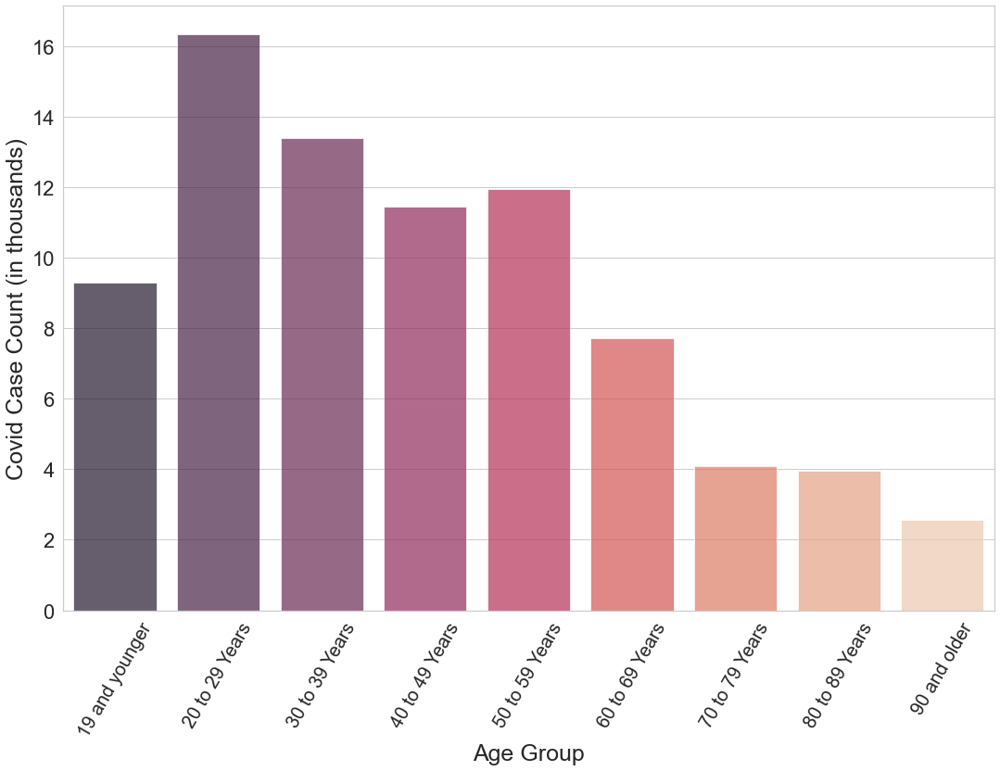

In [78]:
c = sns.barplot(data = age, x='Age_Group', y='Cases_Count_1000',palette="rocket", alpha=0.7);
c.set_ylabel("Covid Case Count (in thousands)",fontsize=25);
c.set_xlabel("Age Group",fontsize=25)
c.set_xticklabels(labels=list(age_data['Age_Group']),rotation=60,fontsize=20);

Therefore, it is important to get an understanding of the population tally of each of these age groups. This demographic data is taken from StatCan. This is the 2016 census data and I assumed a 5% growth to 2021, which is slightly greater than the growth from 2011 to 2016 (4.3%).

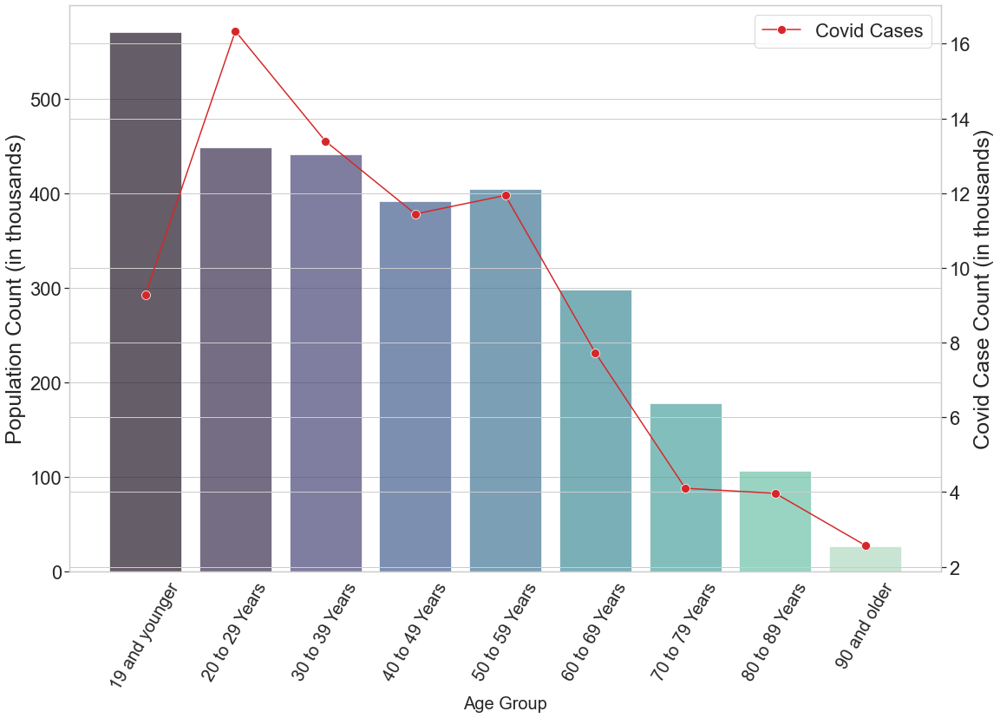

In [11]:
fig, ax1 = plt.subplots();
b = sns.barplot(data = age_data, x='Age_Group', y='Total_Count_1000', ax=ax1, palette="mako", alpha=0.7);
b.set_xticklabels(labels=list(age_data['Age_Group']),rotation=60,fontsize=20)
b.set_xlabel("Age Group",fontsize=20)
b.set_ylabel("Population Count (in thousands)",fontsize=25)
ax2 = ax1.twinx();
l = sns.lineplot(data = age['Cases_Count_1000'], marker='o', sort = False,color='tab:red', ax=ax2, markersize=10,label='Covid Cases');
l.set_ylabel("Covid Case Count (in thousands)",fontsize=25);
plt.legend();

In [12]:
merge_data = age_data.merge(age,on='Age_Group')
merge_data['Ratio'] = 100*merge_data['Cases_Count']/merge_data['Total_Count']
display(merge_data.head())

,Age_Group,Total_Count,Percent_Total,Total_Count_1000,Cases_Count,Percent_Cases,Cases_Count_1000,Ratio
0,19 and younger,570837,19.902703,570.837,9287,11.498081,9.287,1.626909
1,20 to 29 Years,449080,15.657545,449.080,16339,20.229045,16.339,3.638327
2,30 to 39 Years,441935,15.408429,441.935,13395,16.584128,13.395,3.030989
3,40 to 49 Years,391981,13.666741,391.981,11444,14.168627,11.444,2.919529
4,50 to 59 Years,404470,14.102181,404.470,11941,14.783954,11.941,2.952259


The ratio of cases to population is significantly higher in 90 and older (10) in comparison to the other age groups (3). Although the 90+ age group population is the smallest, a lot of them reside in long-term care homes where severe outbreaks were observed. 

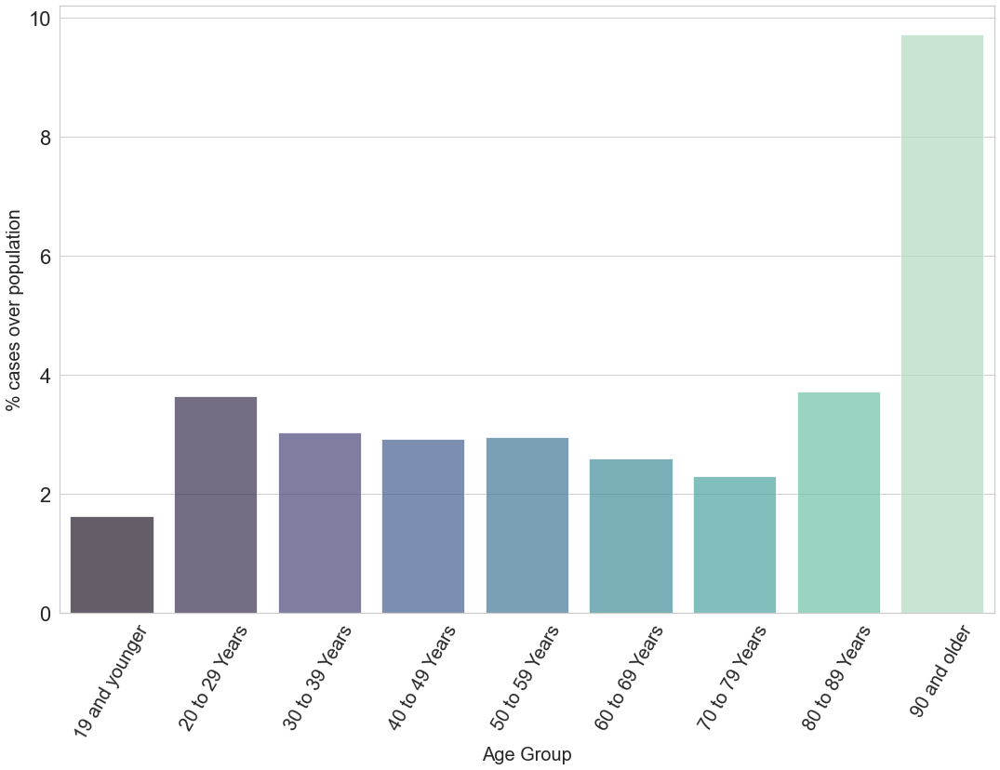

In [13]:
b = sns.barplot(data = merge_data, x='Age_Group', y='Ratio', palette="mako", alpha=0.7);
b.set_xticklabels(labels=list(age_data['Age_Group']),rotation=60,fontsize=20);
b.set_xlabel("Age Group",fontsize=20);
b.set_ylabel("% cases over population",fontsize=20);

Out of all the cases in Toronto, about 70000 of the cases have been resolved and about 3% of the cases (2265) were fatal.

In [103]:
display(data.groupby(['Outcome']).size().reset_index(name='Cases_Count'))

,Outcome,Cases_Count
0,ACTIVE,7544
1,FATAL,2265
2,RESOLVED,70027


In [14]:
age_out = data.groupby(['Age Group','Outcome']).size()
display(age_out.head())

Age Group       Outcome 
19 and younger  ACTIVE       822
                FATAL          1
                RESOLVED    8464
20 to 29 Years  ACTIVE      1604
                FATAL          2
dtype: int64

In [15]:
act = np.array([age_out[age]['ACTIVE'] for age in list(data['Age Group'].unique())])
fat = np.array([age_out[age]['FATAL'] for age in list(data['Age Group'].unique())])
res = np.array([age_out[age]['RESOLVED'] for age in list(data['Age Group'].unique())])
tot = act + fat + res
per_fat = 100*fat/tot

Age_data = pd.DataFrame({'Age_Group':list(data['Age Group'].unique()),'Count_resolved':res,'Count_fatal':fat,
                         'Count_active':act,'Total_Count':tot,'Percent_fatal':per_fat, 'Total_Count_1000':tot/1000})

Age_data = Age_data.reindex([7,1,5,6,0,2,4,3,8])
display(Age_data)

,Age_Group,Count_resolved,Count_fatal,Count_active,Total_Count,Percent_fatal,Total_Count_1000
7,19 and younger,8464,1,822,9287,0.010768,9.287
1,20 to 29 Years,14733,2,1604,16339,0.012241,16.339
5,40 to 49 Years,10337,18,1089,11444,0.157288,11.444
6,30 to 39 Years,12141,4,1250,13395,0.029862,13.395
0,50 to 59 Years,10688,71,1182,11941,0.594590,11.941
2,60 to 69 Years,6697,213,818,7728,2.756211,7.728
4,70 to 79 Years,3273,408,419,4100,9.951220,4.100
3,80 to 89 Years,2850,822,292,3964,20.736630,3.964
8,90 and older,1675,769,128,2572,29.898911,2.572


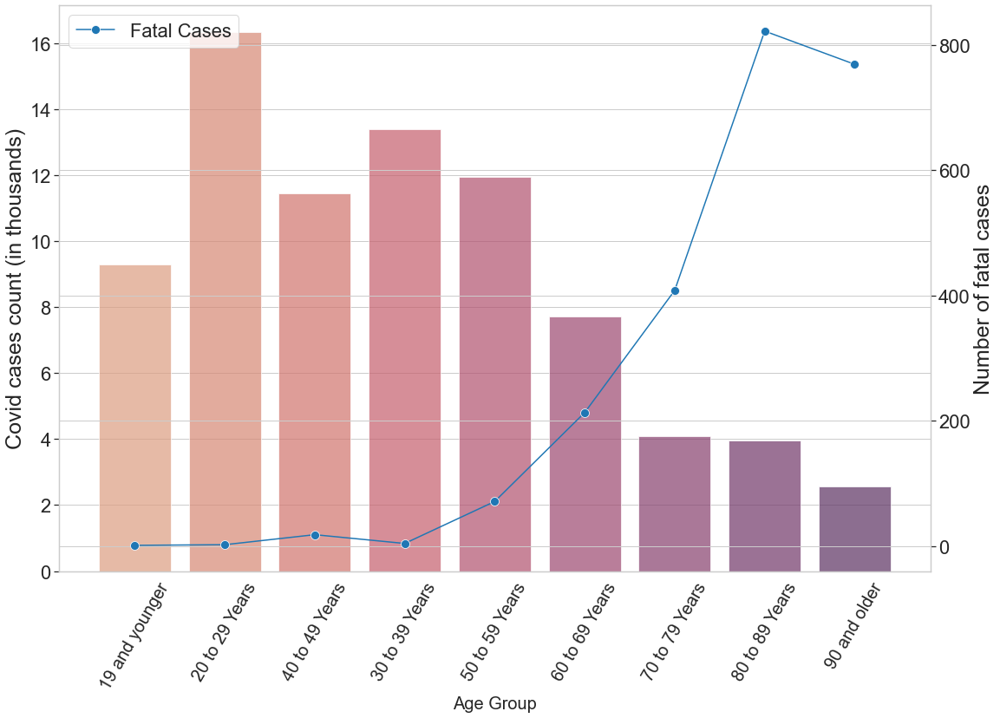

In [16]:
fig, ax1 = plt.subplots();
b = sns.barplot(data = Age_data, x='Age_Group', y='Total_Count_1000', ax=ax1, palette="flare", alpha=0.7);
b.set_xticklabels(labels=list(age_data['Age_Group']),rotation=60,fontsize=20)
b.set_xlabel("Age Group",fontsize=20)
b.set_ylabel("Covid cases count (in thousands)",fontsize=25)
ax2 = ax1.twinx();
l = sns.lineplot(data = Age_data,x='Age_Group',y='Count_fatal', marker='o', sort = False,color='tab:blue', ax=ax2, markersize=10,label='Fatal Cases');
l.set_ylabel("Number of fatal cases",fontsize=25);
plt.legend();

We can see that, as the age increases the number of infections decreases significantly, while the number of fatal cases increases dramatically. The percentage of fatality for the age groups are shown below.

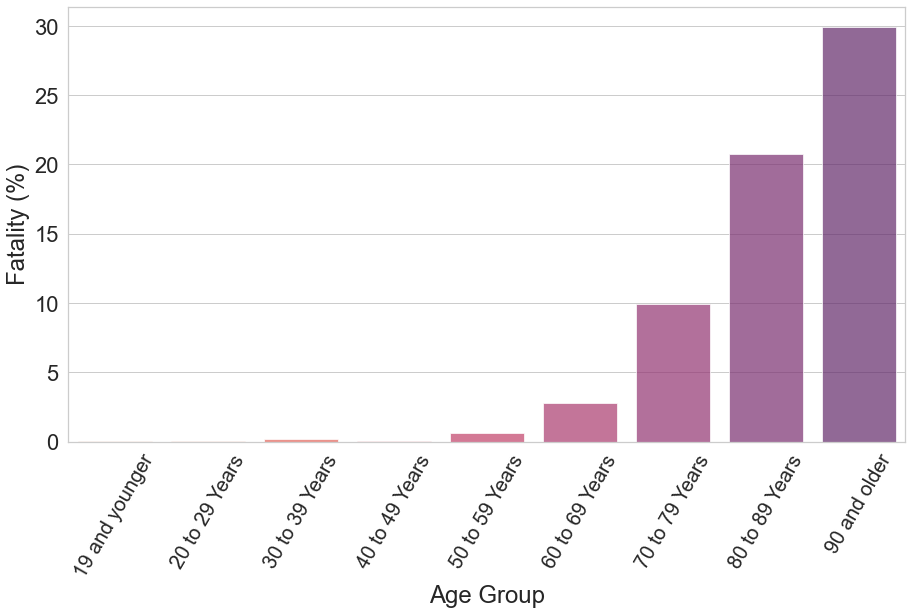

In [17]:
g = sns.barplot(x="Age_Group", y="Percent_fatal", data=Age_data, saturation=1, palette="flare", alpha=0.7)
g.set_xticklabels(labels=list(age['Age_Group']),rotation=60,fontsize=20)
plt.gcf().set_size_inches(15, 8)
g.set(xlabel='Age Group', ylabel='Fatality (%)');

In [18]:
source_data = data.groupby('Source of Infection').size().reset_index(name='Count')
source_data.rename(columns={'Source of Infection':'Source'},inplace=True)
source_data['Count_1000'] = source_data['Count']/1000
source_data['Source'] = source_data['Source'].replace({'N/A - Outbreak associated':'Outbreak','Unknown/Missing':'Unknown'})
display(source_data.head())

,Source,Count,Count_1000
0,Close contact,17547,17.547
1,Community,9466,9.466
2,Healthcare,2134,2.134
3,Institutional,1605,1.605
4,Outbreak,14030,14.030


It is a bit concerning and even scary that the source of infection for most of the cases is unknown. This shows how difficult contact tracing is.

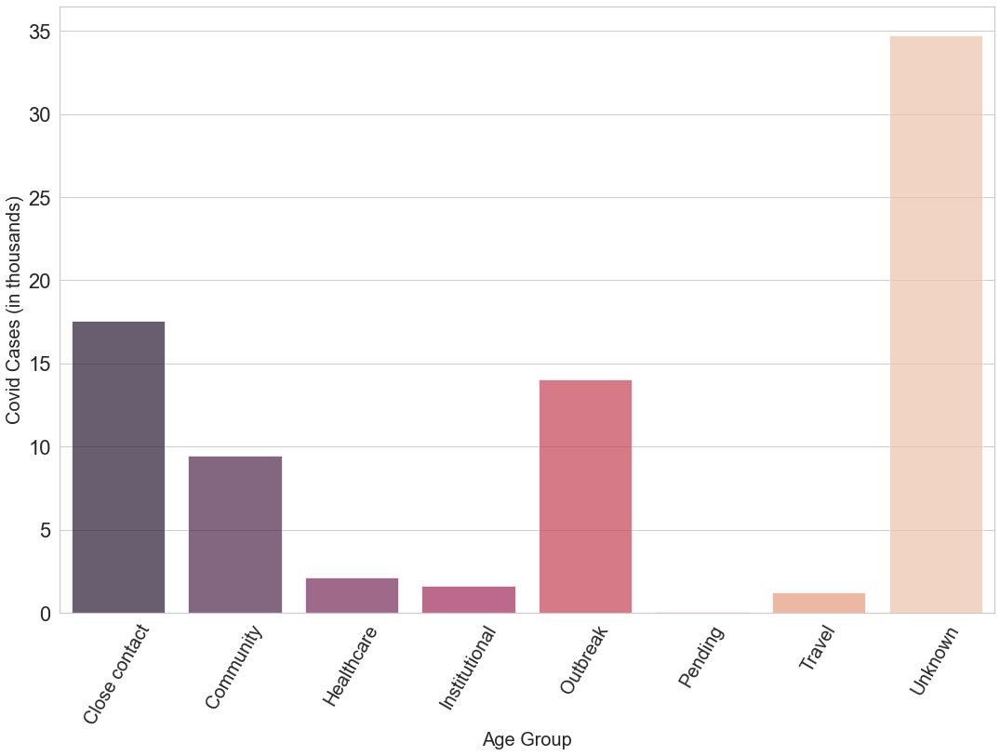

In [19]:
b = sns.barplot(data = source_data, x='Source', y='Count_1000', palette="rocket", alpha=0.7);
b.set_xticklabels(labels=list(source_data['Source']),rotation=60,fontsize=20);
b.set_xlabel("Age Group",fontsize=20);
b.set_ylabel("Covid Cases (in thousands)",fontsize=20);

In [20]:
source_out = data.groupby(['Source of Infection','Age Group']).size().reset_index(name='Count')
source_out.rename(columns={'Source of Infection':'Source'},inplace=True)
source_out['Count_1000'] = source_out['Count']/1000
source_out['Source'] = source_out['Source'].replace({'N/A - Outbreak associated':'Outbreak','Unknown/Missing':'Unknown'})
display(source_out.head())

,Source,Age Group,Count,Count_1000
0,Close contact,19 and younger,4495,4.495
1,Close contact,20 to 29 Years,3568,3.568
2,Close contact,30 to 39 Years,2604,2.604
3,Close contact,40 to 49 Years,2258,2.258
4,Close contact,50 to 59 Years,2305,2.305


Most of the cases on the younger side of the age group correspond to close contact and community transmission. While outbreak-related infections is the leading source of infection in ages 80 and older.

C:\Users\srpra\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: FixedFormatter should only be used together with FixedLocator
  


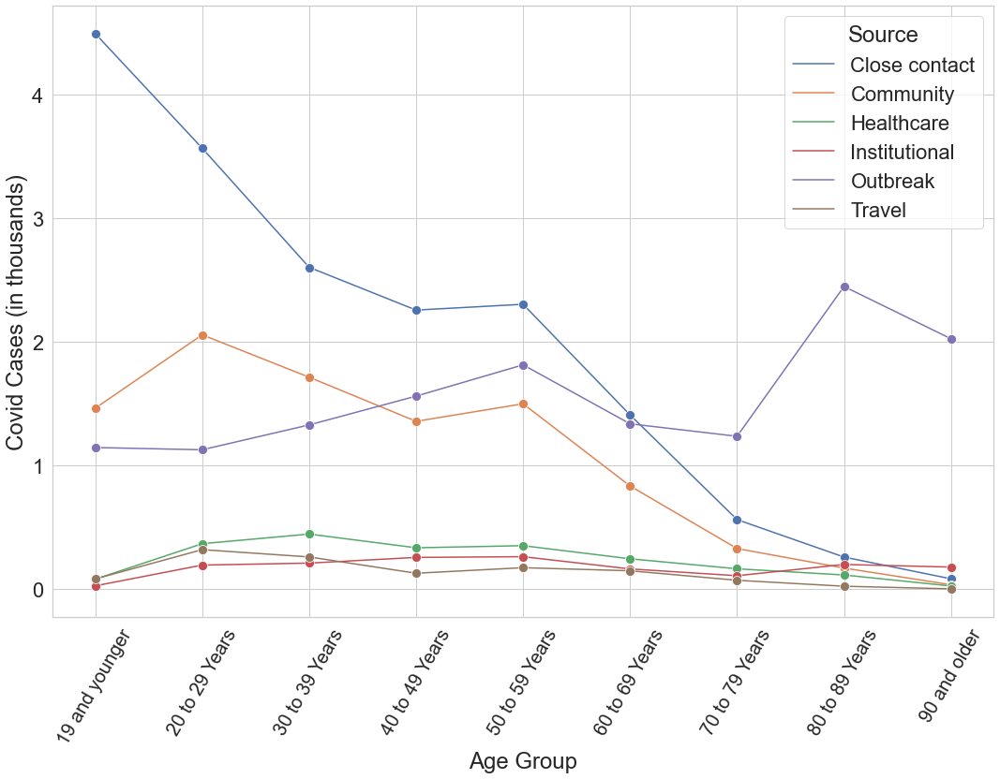

In [21]:
g = sns.lineplot(data=source_out.query('Source != "Unknown" and Source != "Pending"'),x='Age Group',y='Count_1000',hue='Source',marker='o',markersize=10);
g.set_xticklabels(labels=list(age['Age_Group']),rotation=60,fontsize=20)
g.set(xlabel='Age Group', ylabel='Covid Cases (in thousands)');

In [66]:
source_outc = data.groupby(['Outcome','Source of Infection']).size().reset_index(name='Count')
source_outc.rename(columns={'Source of Infection':'Source'},inplace=True)
source_outc['Count_1000'] = source_outc['Count']/1000
source_outc['Source'] = source_outc['Source'].replace({'N/A - Outbreak associated':'Outbreak','Unknown/Missing':'Unknown'})
display(source_outc.head())

,Outcome,Source,Count,Count_1000
0,ACTIVE,Close contact,934,0.934
1,ACTIVE,Community,434,0.434
2,ACTIVE,Healthcare,67,0.067
3,ACTIVE,Institutional,156,0.156
4,ACTIVE,Outbreak,456,0.456


Outbreak particularly in long-term care units can be seen as the primary contributor to the fatal cases.

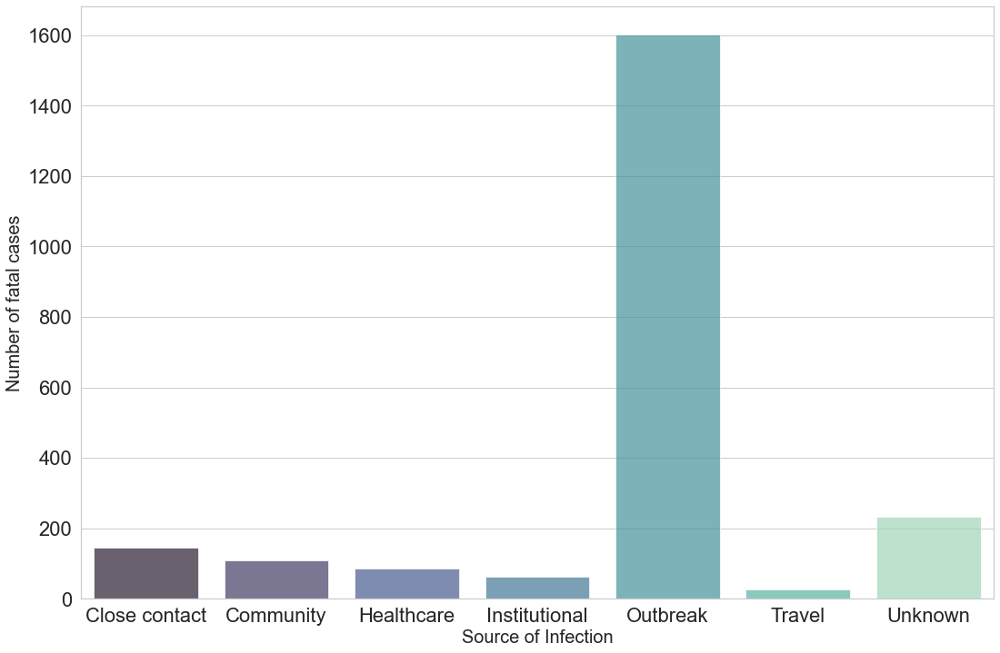

In [70]:
b = sns.barplot(data = source_outc.query('Outcome=="FATAL"'), x='Source', y='Count', palette="mako", alpha=0.7);
b.set_xlabel("Source of Infection",fontsize=20);
b.set_ylabel("Number of fatal cases",fontsize=20);

In [22]:
df = data.copy()
df['Reported Date'] = pd.to_datetime(df['Reported Date'])
df = df.set_index('Reported Date')
df['Count'] = 1
display(df.head())

,_id,Assigned_ID,Outbreak Associated,Age Group,Neighbourhood Name,FSA,Source of Infection,Classification,Episode Date,Client Gender,Outcome,Currently Hospitalized,Currently in ICU,Currently Intubated,Ever Hospitalized,Ever in ICU,Ever Intubated,Count
Reported Date,,,,,,,,,,,,,,,,,,
2020-01-23,1,1,Sporadic,50 to 59 Years,Willowdale East,M2N,Travel,CONFIRMED,2020-01-22,FEMALE,RESOLVED,No,No,No,No,No,No,1
2020-01-23,2,2,Sporadic,50 to 59 Years,Willowdale East,M2N,Travel,CONFIRMED,2020-01-21,MALE,RESOLVED,No,No,No,Yes,No,No,1
2020-02-21,3,3,Sporadic,20 to 29 Years,Parkwoods-Donalda,M3A,Travel,CONFIRMED,2020-02-05,FEMALE,RESOLVED,No,No,No,No,No,No,1
2020-02-25,4,4,Sporadic,60 to 69 Years,Church-Yonge Corridor,M4W,Travel,CONFIRMED,2020-02-16,FEMALE,RESOLVED,No,No,No,No,No,No,1
2020-02-26,5,5,Sporadic,60 to 69 Years,Church-Yonge Corridor,M4W,Travel,CONFIRMED,2020-02-20,MALE,RESOLVED,No,No,No,No,No,No,1


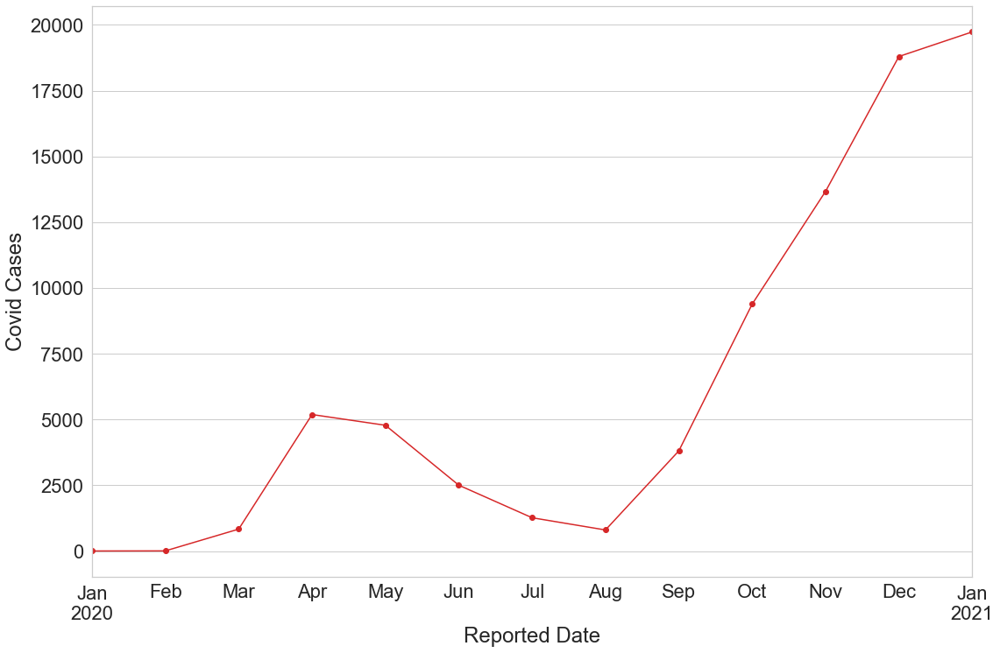

In [97]:
df['Count'].resample('M').sum().plot(c='tab:red',ylabel='Covid Cases',marker='o');

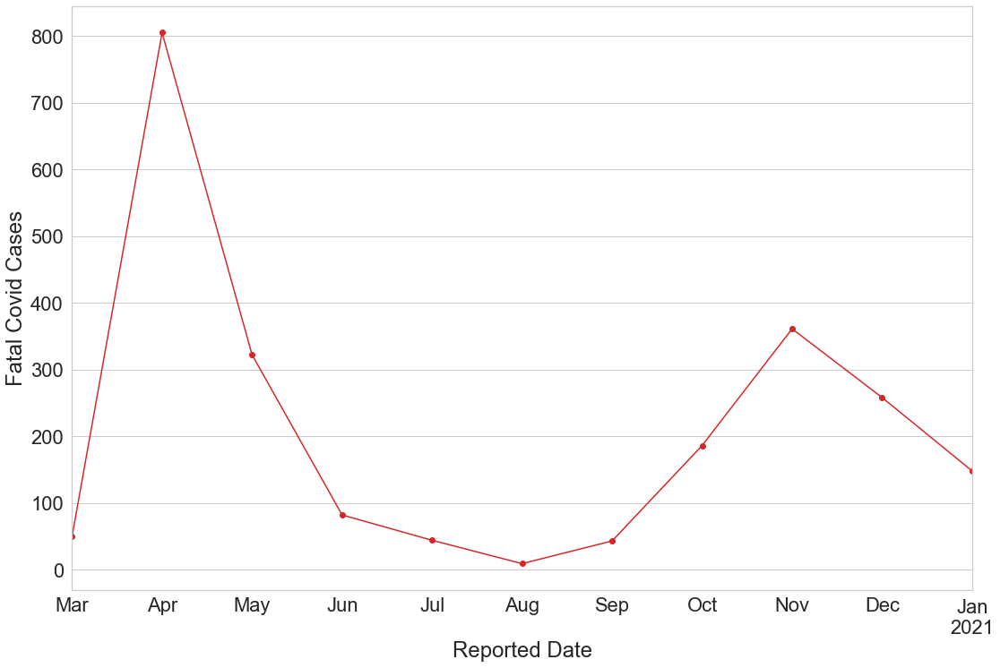

In [100]:
df.query('Outcome == "FATAL"')['Count'].resample('M').sum().plot(c='tab:red',ylabel='Fatal Covid Cases',marker='o');

The plots above show the total number of cases and the number of fatal cases reported every month since the start of the pandemic. We could clearly spot two waves, the second of which is still ongoing. The peak was of the first wave that ended in August can be seen to be in April. The second wave appears to have infected a significantly larger population, but resulting in fewer fatal cases.

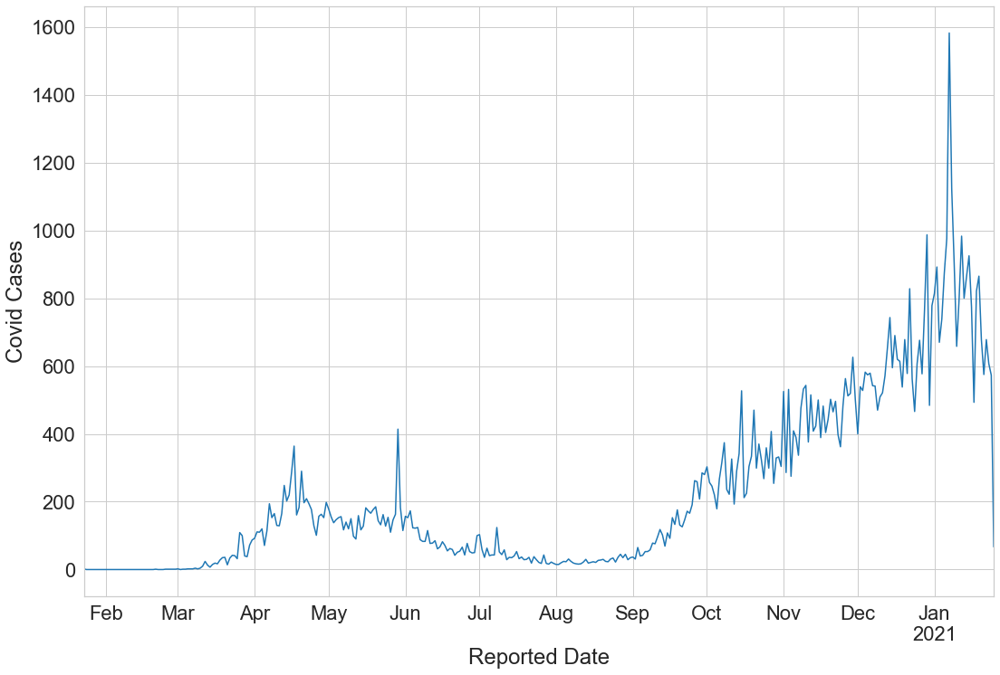

In [24]:
df['Count'].resample('D').sum().plot(c='tab:blue',ylabel='Covid Cases');

In [25]:
data = data[data['FSA'].notna()]

In [26]:
toronto_geo = gpd.read_file('GeoJSON/Toronto_fsa.geojson')
toronto_geo = toronto_geo[['CFSAUID','geometry']]
toronto_geo.columns = ['Postal_code','geometry']
toronto_geo.head()

,Postal_code,geometry
0,M9R,"MULTIPOLYGON (((-79.56131 43.67478, -79.56249 ..."
1,M9V,"MULTIPOLYGON (((-79.57759 43.76205, -79.57829 ..."
2,M9W,"MULTIPOLYGON (((-79.53885 43.72937, -79.53884 ..."
3,M1P,"MULTIPOLYGON (((-79.24704 43.75374, -79.24720 ..."
4,M1R,"MULTIPOLYGON (((-79.28125 43.73867, -79.27985 ..."


In [27]:
fsa_out = data.groupby(['FSA','Outcome']).size()
display(fsa_out.head())

FSA  Outcome 
M1B  ACTIVE       236
     FATAL         38
     RESOLVED    2599
M1C  ACTIVE       102
     FATAL         75
dtype: int64

In [28]:
count_act = []
count_fat = []
count_res = []

for code in toronto_geo['Postal_code']:
    try:
        count_act.append(fsa_out[code]['ACTIVE'])
    except:
        count_act.append(0)
        
for code in toronto_geo['Postal_code']:
    try:
        count_fat.append(fsa_out[code]['FATAL'])
    except:
        count_fat.append(0)
        
for code in toronto_geo['Postal_code']:
    try:
        count_res.append(fsa_out[code]['RESOLVED'])
    except:
        count_res.append(0)
        
count_act = np.array(count_act)
count_fat = np.array(count_fat)
count_res = np.array(count_res)

total_count = count_act + count_fat + count_res

count_data = pd.DataFrame({'Postal_code':toronto_geo['Postal_code'],'Count_act':count_act,'Count_fat':count_fat,
                          'Count_res':count_res,'Total_count':total_count})
display(count_data.head())  

,Postal_code,Count_act,Count_fat,Count_res,Total_count
0,M9R,123,17,1198,1338
1,M9V,311,105,3587,4003
2,M9W,169,28,1792,1989
3,M1P,179,100,1636,1915
4,M1R,101,17,795,913


In [29]:
data_geo = toronto_geo.merge(count_data, on='Postal_code')
display(data_geo.head())

,Postal_code,geometry,Count_act,Count_fat,Count_res,Total_count
0,M9R,"MULTIPOLYGON (((-79.56131 43.67478, -79.56249 ...",123,17,1198,1338
1,M9V,"MULTIPOLYGON (((-79.57759 43.76205, -79.57829 ...",311,105,3587,4003
2,M9W,"MULTIPOLYGON (((-79.53885 43.72937, -79.53884 ...",169,28,1792,1989
3,M1P,"MULTIPOLYGON (((-79.24704 43.75374, -79.24720 ...",179,100,1636,1915
4,M1R,"MULTIPOLYGON (((-79.28125 43.73867, -79.27985 ...",101,17,795,913


In [79]:
map_toronto = folium.Map(location=[43.653963, -79.387207], zoom_start=11)

folium.Choropleth(
    geo_data=data_geo,
    data=count_data,
    columns=['Postal_code','Total_count'],
    key_on='feature.properties.Postal_code',
    fill_color='BuPu',
    fill_opacity=0.8, 
    line_opacity=1,
    legend_name='Covid cases by FSA',
).add_to(map_toronto)

style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0, 
                            'weight': 1}

interac_feat = folium.features.GeoJson(
    data_geo,
    style_function=style_function, 
    control=False,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Postal_code', 'Count_act', 'Count_fat', 'Count_res'],
        aliases=['Postal code: ',
                 'Covid cases active: ',
                'Covid cases fatal: ',
                'Covid cases resolved'],
        style=("background-color: white; color: #000000; font-family: arial; font-size: 15px; padding: 10px;") 
    )
)
map_toronto.add_child(interac_feat)
map_toronto.keep_in_front(interac_feat)
folium.LayerControl().add_to(map_toronto)

display(map_toronto)

In [32]:
map_toronto.save('Toronto_covid.html')

In [82]:
map_toronto = folium.Map(location=[43.653963, -79.387207], zoom_start=11)

folium.Choropleth(
    geo_data=data_geo,
    data=count_data,
    columns=['Postal_code','Count_act'],
    key_on='feature.properties.Postal_code',
    fill_color='BuPu',
    fill_opacity=0.8, 
    line_opacity=1,
    legend_name='Covid cases by FSA',
).add_to(map_toronto)

style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0, 
                            'weight': 1}

interac_feat = folium.features.GeoJson(
    data_geo,
    style_function=style_function, 
    control=False,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Postal_code', 'Count_act', 'Count_fat', 'Count_res'],
        aliases=['Postal code: ',
                 'Covid cases active: ',
                'Covid cases fatal: ',
                'Covid cases resolved'],
        style=("background-color: white; color: #000000; font-family: arial; font-size: 15px; padding: 10px;") 
    )
)
map_toronto.add_child(interac_feat)
map_toronto.keep_in_front(interac_feat)
folium.LayerControl().add_to(map_toronto)

display(map_toronto)

In [96]:
map_toronto = folium.Map(location=[43.653963, -79.387207], zoom_start=11)

folium.Choropleth(
    geo_data=data_geo,
    data=count_data,
    columns=['Postal_code','Count_fat'],
    key_on='feature.properties.Postal_code',
    fill_color='BuPu',
    fill_opacity=0.8, 
    line_opacity=1,
    legend_name='Covid cases by FSA',
).add_to(map_toronto)

style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0, 
                            'weight': 1}

interac_feat = folium.features.GeoJson(
    data_geo,
    style_function=style_function, 
    control=False,
    tooltip=folium.features.GeoJsonTooltip(
        fields=['Postal_code', 'Count_act', 'Count_fat', 'Count_res'],
        aliases=['Postal code: ',
                 'Covid cases active: ',
                'Covid cases fatal: ',
                'Covid cases resolved'],
        style=("background-color: white; color: #000000; font-family: arial; font-size: 15px; padding: 10px;") 
    )
)
map_toronto.add_child(interac_feat)
map_toronto.keep_in_front(interac_feat)
folium.LayerControl().add_to(map_toronto)

display(map_toronto)